## Parte 1 - c

In [2]:
import pandas as pd

In [3]:
data = pd.read_csv("ods_final.csv")

In [4]:
data.drop(["Country Code", "Indicator Code"], axis=1, inplace=True)
data.drop([str(year) for year in range(1990, 2005)], axis=1, inplace=True)

In [5]:
data.dtypes

Country Name       object
Indicator Name     object
2005              float64
2006              float64
2007              float64
2008              float64
2009              float64
2010              float64
2011              float64
2012              float64
2013              float64
2014              float64
2015              float64
2016              float64
2017              float64
2018              float64
2019              float64
2020              float64
dtype: object

In [6]:
data.head()

,Country Name,Indicator Name,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Arab World,Access to clean fuels and technologies for coo...,81.025768,81.965815,82.787189,83.475733,84.157423,84.683344,85.192742,85.644218,85.932567,86.232384,86.478597,86.722685,86.937933,87.040774,87.235539,87.307068
1,Arab World,Access to electricity (% of population),83.212982,85.459003,83.764440,83.386990,84.313484,87.114863,87.332661,87.039588,88.992620,88.015356,88.681886,89.195062,90.324659,88.910749,89.999946,90.277735
2,Arab World,Adolescent fertility rate (births per 1000 wom...,51.212964,50.839602,50.519536,50.305291,50.119204,49.966897,49.866968,49.791067,49.345359,48.853998,48.279738,47.504739,46.687119,46.002723,45.245369,44.406611
3,Arab World,Adolescents out of school (% of lower secondar...,22.989800,22.770361,22.480301,21.773720,20.483730,20.344179,20.335569,19.065210,21.608210,20.438419,19.498341,18.654560,18.455170,17.220699,16.369221,16.837469
4,Arab World,Employment in agriculture (% of total employme...,27.675792,26.839165,26.254170,25.405518,24.280701,23.116911,22.717904,21.844827,21.690171,21.464857,20.829068,20.315232,19.741404,18.602308,17.976566,NaN


In [7]:

melted_df = data.melt(id_vars=['Country Name', 'Indicator Name'], var_name='Year', value_name='Value')


pivot_df = melted_df.pivot_table(index=['Country Name', 'Year'], columns='Indicator Name', values='Value')


pivot_df.reset_index(inplace=True)

pivot_df


Indicator Name,Country Name,Year,Access to clean fuels and technologies for cooking (% of population),Access to electricity (% of population),Adolescent fertility rate (births per 1000 women ages 15-19),Adolescents out of school (% of lower secondary school age),Employment in agriculture (% of total employment) (modeled ILO estimate),Employment in industry (% of total employment) (modeled ILO estimate),Employment in services (% of total employment) (modeled ILO estimate),Households and NPISHs Final consumption expenditure (annual % growth),People using at least basic drinking water services (% of population),People using at least basic sanitation services (% of population),People using safely managed drinking water services (% of population),Primary completion rate total (% of relevant age group),Urban population (% of total population)
0,Afghanistan,2005,12.20,25.390894,138.4284,NaN,62.150002,11.33,26.530001,NaN,36.401501,27.475416,14.107275,NaN,22.703
1,Afghanistan,2006,13.85,30.718691,135.7602,NaN,61.279999,11.79,26.930000,NaN,38.475460,28.884040,14.909052,NaN,22.907
2,Afghanistan,2007,15.30,36.051010,133.0920,NaN,60.139999,12.20,27.660000,NaN,40.875746,30.374641,16.093878,NaN,23.113
3,Afghanistan,2008,16.70,42.400002,126.6330,NaN,59.290001,12.48,28.230000,NaN,43.311145,31.873854,17.322399,NaN,23.320
4,Afghanistan,2009,18.40,46.740051,120.1740,NaN,56.889999,13.63,29.480000,NaN,45.781609,33.381862,18.263765,NaN,23.528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4167,Zimbabwe,2016,29.80,42.561729,90.6766,2.261470,66.879997,7.05,26.070000,-10.501114,64.468964,37.529193,30.183683,99.265839,32.296
4168,Zimbabwe,2017,29.80,44.178635,86.1350,2.356790,66.480003,6.90,26.629999,1.396143,63.996625,36.941673,29.997683,95.476372,32.237
4169,Zimbabwe,2018,29.90,45.572647,83.2486,6.226070,66.019997,6.75,27.230000,-22.393220,63.538773,36.357160,29.827913,92.195152,32.209
4170,Zimbabwe,2019,30.10,46.781475,80.3622,7.544310,66.190002,6.57,27.240000,NaN,63.094957,35.774337,29.673569,88.508812,32.210


In [7]:
pivot_df.shape

(4172, 15)

In [ ]:
from ydata_profiling import ProfileReport
ProfileReport(pivot_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
# Limpiar los datos

numeric_columns = pivot_df.select_dtypes(include=['float64', 'int64']).columns
column_means = pivot_df[numeric_columns].mean()
df_clean =  pivot_df.copy()  # Copia del DataFrame original para no modificarlo directamente
df_clean[numeric_columns] = df_clean[numeric_columns].fillna(column_means)
print("Valores NaN:\n", df_clean.isna().sum())
df_clean

Valores NaN:
 Indicator Name
Country Name                                                                0
Year                                                                        0
Access to clean fuels and technologies for cooking (% of population)        0
Access to electricity (% of population)                                     0
Adolescent fertility rate (births per 1000 women ages 15-19)                0
Adolescents out of school (% of lower secondary school age)                 0
Employment in agriculture (% of total employment) (modeled ILO estimate)    0
Employment in industry (% of total employment) (modeled ILO estimate)       0
Employment in services (% of total employment) (modeled ILO estimate)       0
Households and NPISHs Final consumption expenditure (annual % growth)       0
People using at least basic drinking water services (% of population)       0
People using at least basic sanitation services (% of population)           0
People using safely managed drinkin

Indicator Name,Country Name,Year,Access to clean fuels and technologies for cooking (% of population),Access to electricity (% of population),Adolescent fertility rate (births per 1000 women ages 15-19),Adolescents out of school (% of lower secondary school age),Employment in agriculture (% of total employment) (modeled ILO estimate),Employment in industry (% of total employment) (modeled ILO estimate),Employment in services (% of total employment) (modeled ILO estimate),Households and NPISHs Final consumption expenditure (annual % growth),People using at least basic drinking water services (% of population),People using at least basic sanitation services (% of population),People using safely managed drinking water services (% of population),Primary completion rate total (% of relevant age group),Urban population (% of total population)
0,Afghanistan,2005,12.20,25.390894,138.4284,13.054666,62.150002,11.330000,26.530001,3.394257,36.401501,27.475416,14.107275,89.540284,22.703
1,Afghanistan,2006,13.85,30.718691,135.7602,13.054666,61.279999,11.790000,26.930000,3.394257,38.475460,28.884040,14.909052,89.540284,22.907
2,Afghanistan,2007,15.30,36.051010,133.0920,13.054666,60.139999,12.200000,27.660000,3.394257,40.875746,30.374641,16.093878,89.540284,23.113
3,Afghanistan,2008,16.70,42.400002,126.6330,13.054666,59.290001,12.480000,28.230000,3.394257,43.311145,31.873854,17.322399,89.540284,23.320
4,Afghanistan,2009,18.40,46.740051,120.1740,13.054666,56.889999,13.630000,29.480000,3.394257,45.781609,33.381862,18.263765,89.540284,23.528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4167,Zimbabwe,2016,29.80,42.561729,90.6766,2.261470,66.879997,7.050000,26.070000,-10.501114,64.468964,37.529193,30.183683,99.265839,32.296
4168,Zimbabwe,2017,29.80,44.178635,86.1350,2.356790,66.480003,6.900000,26.629999,1.396143,63.996625,36.941673,29.997683,95.476372,32.237
4169,Zimbabwe,2018,29.90,45.572647,83.2486,6.226070,66.019997,6.750000,27.230000,-22.393220,63.538773,36.357160,29.827913,92.195152,32.209
4170,Zimbabwe,2019,30.10,46.781475,80.3622,7.544310,66.190002,6.570000,27.240000,3.394257,63.094957,35.774337,29.673569,88.508812,32.210


## Parte 1 - c

Country Name
Afghanistan      16
Morocco          16
Myanmar          16
Namibia          16
Nauru            16
                 ..
Guinea           16
Guinea-Bissau    16
Guyana           16
Zimbabwe         16
Kosovo           12
Name: count, Length: 261, dtype: int64


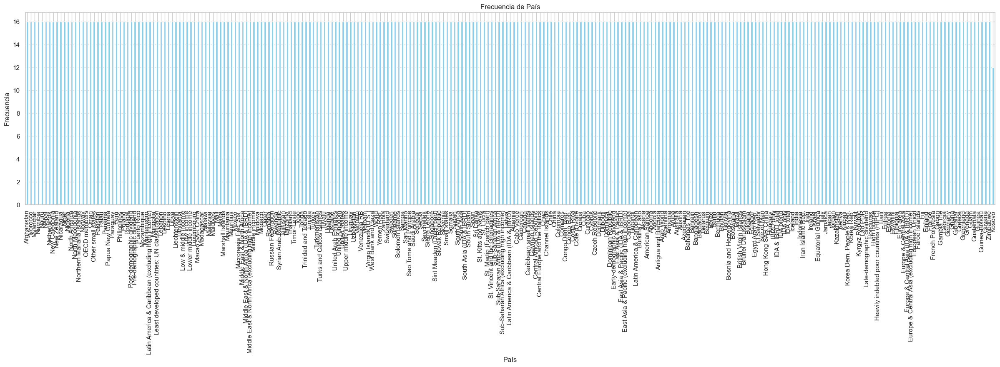

In [27]:
import matplotlib.pyplot as plt

# Frecuencia de países

frecuencia_paises = df_clean['Country Name'].value_counts()
print(frecuencia_paises)

# Crear el gráfico de barras
plt.figure(figsize=(30, 6))
frecuencia_paises.plot(kind='bar', color='skyblue')
plt.title('Frecuencia de País')
plt.xlabel('País')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x para una mejor visualización
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Year
2009    261
2010    261
2011    261
2012    261
2013    261
2014    261
2015    261
2016    261
2017    261
2018    261
2019    261
2020    261
2005    260
2006    260
2007    260
2008    260
Name: count, dtype: int64


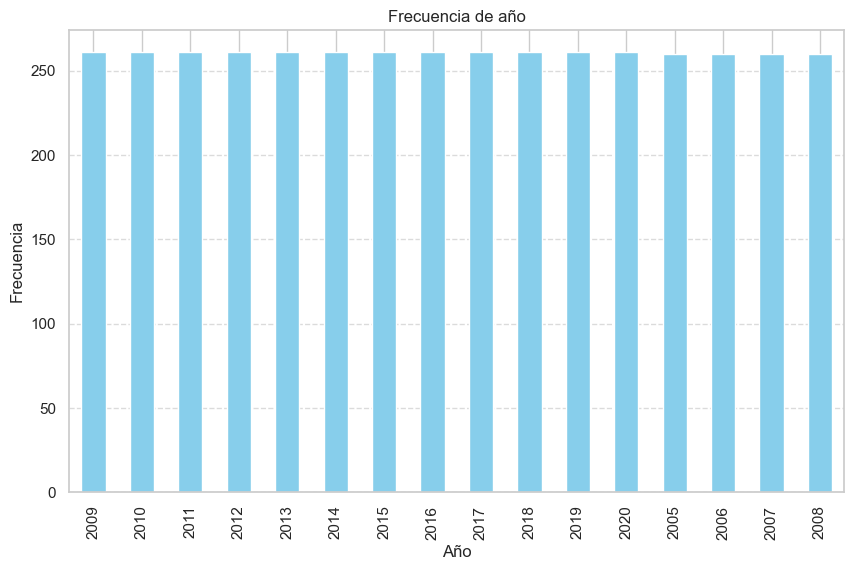

In [28]:
# Frecuencia de años

frecuencia_paises = df_clean['Year'].value_counts()
print(frecuencia_paises)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
frecuencia_paises.plot(kind='bar', color='skyblue')
plt.title('Frecuencia de año')
plt.xlabel('Año')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x para una mejor visualización
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_ol

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_ol

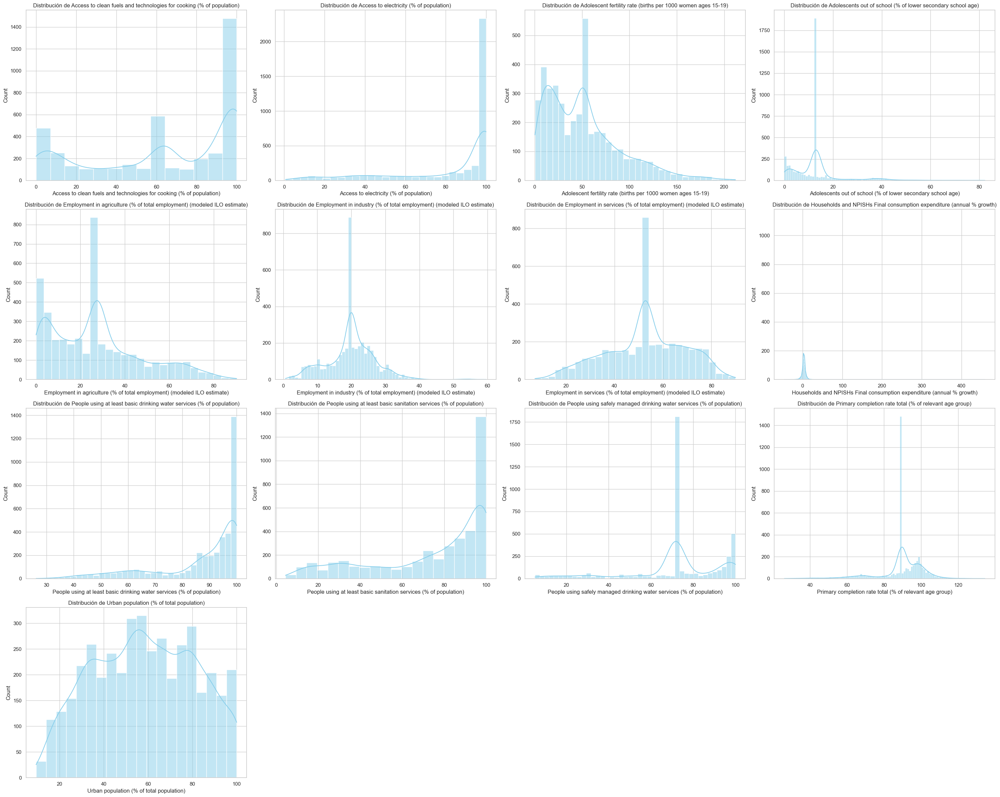

In [25]:
# Distribución de variables numéricas
import seaborn as sns

# Seleccionar solo las columnas numéricas
columnas_numericas = df_clean.select_dtypes(include=['float64'])

# Configurar el estilo y los ajustes de los gráficos
sns.set(style="whitegrid")

# Calcular cuántas filas y columnas necesitamos para subplots basado en el número de columnas numéricas
n = len(columnas_numericas.columns)
ncols = 4  # Definir cuántas columnas quieres por fila
nrows = n // ncols + (n % ncols > 0)  # Esto asegura que tengamos suficientes filas para todos los gráficos

plt.figure(figsize=(30, 6 * nrows))  # Ajustar el tamaño de la figura según el número de subplots

# Iterar sobre las columnas numéricas y crear histogramas y gráficos de densidad
for i, columna in enumerate(columnas_numericas.columns):
    plt.subplot(nrows, ncols, i + 1)
    sns.histplot(columnas_numericas, x=columna, kde=True, color='skyblue')  # Usar columnas_numericas aquí
    plt.title(f'Distribución de {columna}')

plt.tight_layout()
plt.show()

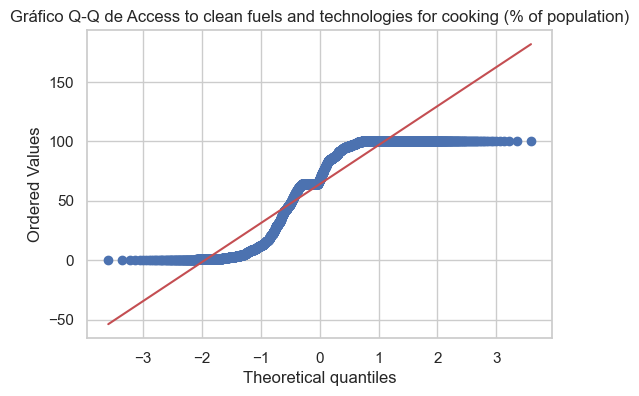

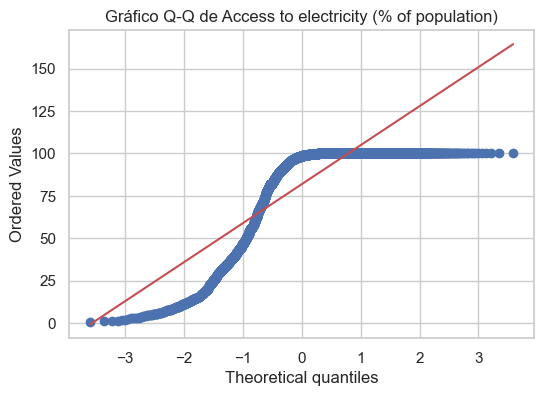

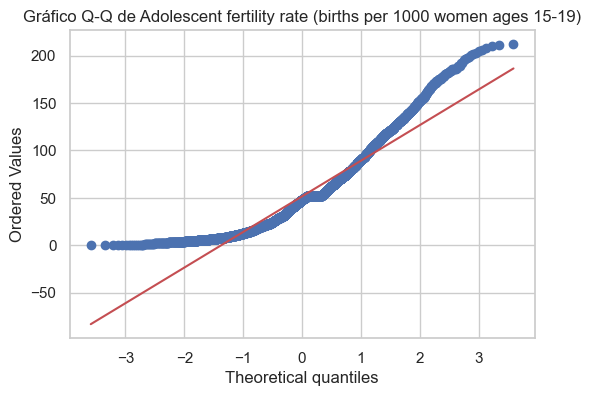

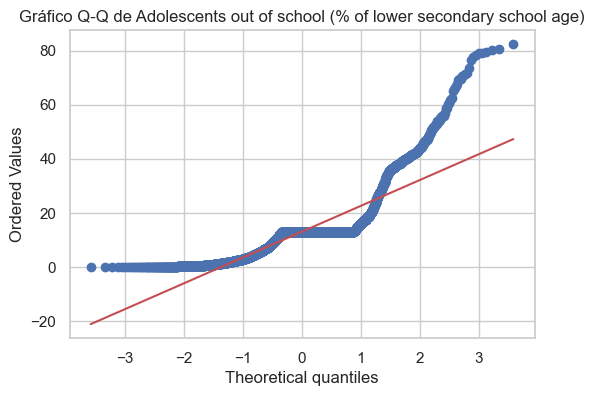

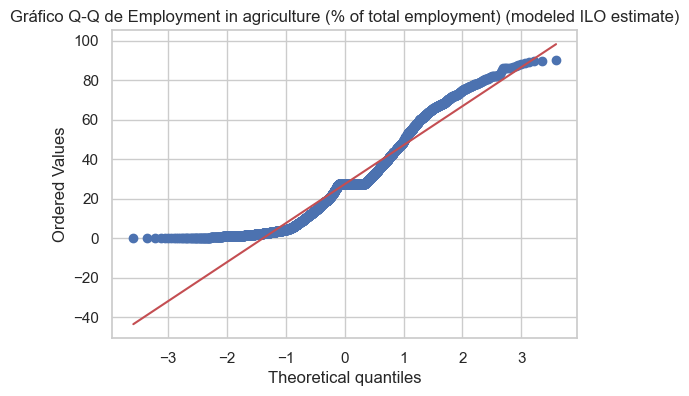

...

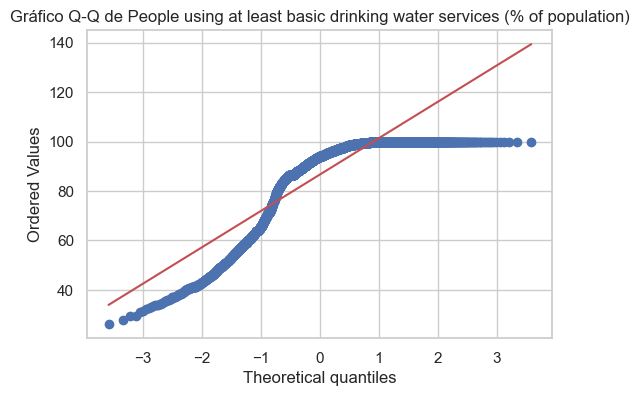

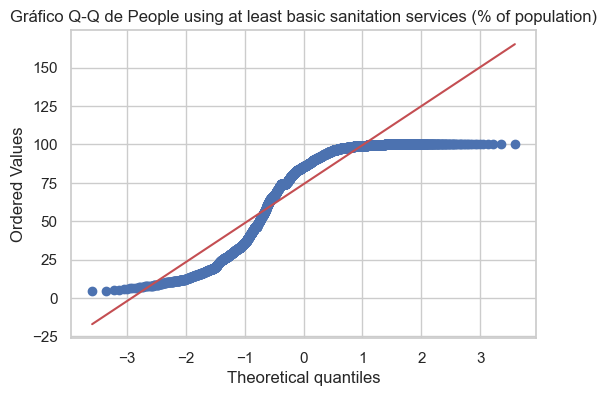

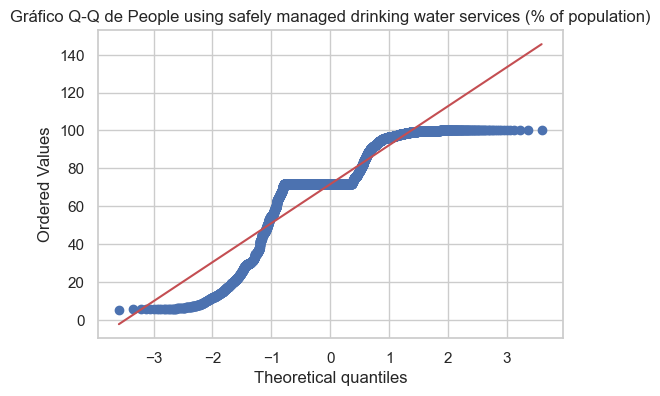

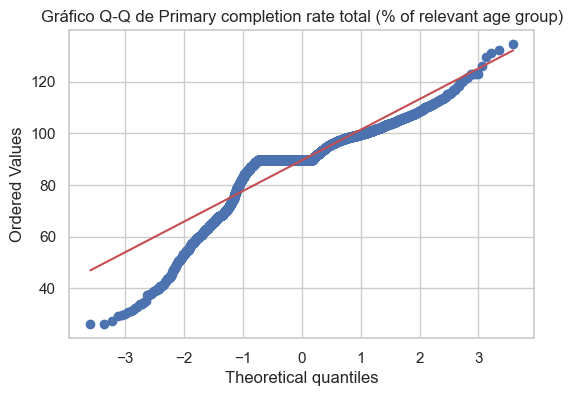

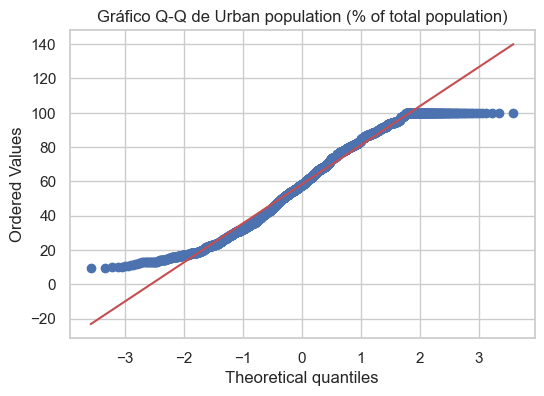

In [26]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Para cada columna numérica en tu DataFrame
for columna in columnas_numericas.columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(columnas_numericas[columna], dist="norm", plot=plt)
    plt.title(f'Gráfico Q-Q de {columna}')
    plt.show()


## Parte 1 - e

In [37]:
from sklearn.cluster import KMeans
import plotly.express as px

# Empleo en agricultura y uso de servicios básicos de sanidad

df_clustering = df_clean.copy()

X = df_clustering[[
    'People using at least basic sanitation services (% of population)',
    'Employment in agriculture (% of total employment) (modeled ILO estimate)',
]]


# Normalización de los datos
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

# Aplicando KMeans
kmeans = KMeans(n_clusters=3, random_state=0)  # El número de clusters debería ser definido según el caso
kmeans.fit(X)

clusters_identificados = kmeans.fit_predict(X)
datos_con_clusters = df_clustering.copy()
datos_con_clusters['Cluster'] = clusters_identificados

# color es un argumento que se puede codificar con una variable
# Todos los puntos en cada cluster tendran el mismo color

datos_con_clusters["Cluster"] = datos_con_clusters["Cluster"].astype("category")

fig = px.scatter(datos_con_clusters, 
                 y = "People using at least basic sanitation services (% of population)", 
                 x = 'Employment in agriculture (% of total employment) (modeled ILO estimate)', 
                 color = "Cluster",
#                 color_discrete_sequence = ["red", "green", "orange"],
#                 size='', 
                 hover_data = ['Country Name', 'Year']
                )

fig.show()

In [36]:
from sklearn.cluster import KMeans
import plotly.express as px

# Adolescentes fuera de la escuela y tasa de embarazo adolescente

df_clustering = df_clean.copy()

X = df_clustering[[
    'Adolescent fertility rate (births per 1000 women ages 15-19)',
    'Adolescents out of school (% of lower secondary school age)'
]]


# Normalización de los datos
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

# Aplicando KMeans
kmeans = KMeans(n_clusters=3, random_state=0)  # El número de clusters debería ser definido según el caso
kmeans.fit(X)

clusters_identificados = kmeans.fit_predict(X)
datos_con_clusters = df_clustering.copy()
datos_con_clusters['Cluster'] = clusters_identificados

# color es un argumento que se puede codificar con una variable
# Todos los puntos en cada cluster tendran el mismo color

datos_con_clusters["Cluster"] = datos_con_clusters["Cluster"].astype("category")

fig = px.scatter(datos_con_clusters, 
                 y = 'Adolescent fertility rate (births per 1000 women ages 15-19)', 
                 x = 'Adolescents out of school (% of lower secondary school age)', 
                 color = "Cluster",
#                 color_discrete_sequence = ["red", "green", "orange"],
#                 size='', 
                 hover_data = ['Country Name']
                )

fig.show()

In [39]:
from sklearn.cluster import KMeans
import plotly.express as px

# Primaria finalizada y empleo en agricultura

df_clustering = df_clean.copy()

X = df_clustering[[
    'Primary completion rate total (% of relevant age group)',
    'Employment in agriculture (% of total employment) (modeled ILO estimate)'
]]


# Normalización de los datos
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

# Aplicando KMeans
kmeans = KMeans(n_clusters=2, random_state=0)  # El número de clusters debería ser definido según el caso
kmeans.fit(X)

clusters_identificados = kmeans.fit_predict(X)
datos_con_clusters = df_clustering.copy()
datos_con_clusters['Cluster'] = clusters_identificados

# color es un argumento que se puede codificar con una variable
# Todos los puntos en cada cluster tendran el mismo color

datos_con_clusters["Cluster"] = datos_con_clusters["Cluster"].astype("category")

fig = px.scatter(datos_con_clusters, 
                 y = 'Employment in agriculture (% of total employment) (modeled ILO estimate)', 
                 x = 'Primary completion rate total (% of relevant age group)', 
                 color = "Cluster",
#                 color_discrete_sequence = ["red", "green", "orange"],
#                 size='', 
                 hover_data = ['Country Name', 'Year']
                )

fig.show()